# **Optimizers**


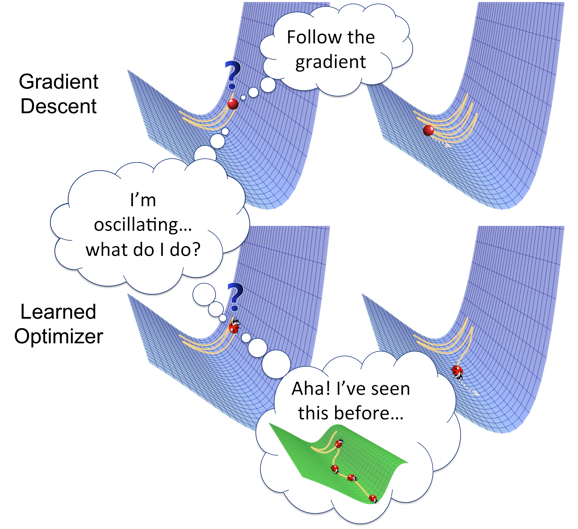

## 1. What is an Optimizer?


In deep learning, an **optimizer** is an algorithm used to adjust the weights and biases of a neural network to minimize the loss function. The loss function tells us how far the model's predictions are from the actual values. <br>

Optimizers are algorithms or methods used to change the attributes of your neural network such as weights and bias in order to reduce the losses.<br>


Without optimization, training a neural network would be inefficient, slow, or even impossible in complex, high-dimensional parameter spaces.<br>

Optimizers enable the training of massive models like GPT-3 and vision transformers.<br>
The optimizer plays a critical role in finding the best parameters (weights) that help the model perform well.


## 2. Why Do We Need Optimizers?

### a) High-Dimensional and Complex Loss Surfaces<br>

- Neural networks have millions of parameters, making the loss function's surface very high-dimensional.<br>
- This surface can have valleys (saddle point), hills, and flat regions (plateau). A simple algorithm like basic gradient descent may struggle to navigate such a surface efficiently.<br>
- Optimizers help navigate this landscape to find a minimum of the loss function efficiently.<p>

### b) Faster Convergence

- Standard gradient descent may converge very slowly due to oscillations or poor learning rates.<br>
- Some optimizers like **Adam** and **Momentum** can accelerate the convergance and help the model reach the minimum of the loss function more quickly than basic gradient descent.

### c) Avoid Getting Stuck

- Optimizers like Adam or Momentum can help the model avoid getting stuck in local minima or flat regions of the loss surface.

### d) Efficient Training

- Training large neural networks can take a long time. Optimizers are designed to reduce computation time while improving accuracy.

### e) Vanishing and Exploding Gradients

- Gradients may become very small (vanish) or very large (explode), especially in deep networks.<br>
- Optimizers like Adam or RMSProp handle these issues by using adaptive learning rates.

### f) Overfitting

- Optimizers with regularization techniques (e.g., dropout, weight decay) can help prevent overfitting.

## 3. Example: Why Optimizers Matter

### Without an Optimizer
Imagine training a deep learning model using **vanilla gradient descent**:<p>
- The model might **move too slowly** in regions where the gradient is small.<br>
- It may **oscillate** back and forth in steep regions, wasting time.<br>
- It could **stop progressing** if it gets stuck in a flat area (plateau) or saddle points.

### With a Good Optimizer
Using an advanced optimizer like **Adam** or **momentum**:
- The optimizer dynamically adjusts the learning rate for each parameter, speeding up training.<br>
- It combines techniques like momentum to smooth the updates and prevent oscillations.<br>
- It avoids flat regions and quickly finds a better solution.<br>

## 4. Types of Optimizers and Their Role

### 4.1. Gradient Descent
- Simplest and most basic optimizer.
- Updates parameters using the gradient of the loss:
  $$
  \theta_{t+1} = \theta_t - \eta \nabla J(\theta_t)
  $$
  - $\theta_t$: Current parameters.
  - $\eta$: Learning rate.
  - $\nabla J(\theta_t)$: Gradient of the loss function.

#### Challenges of Vanilla Gradient Descent
- **Slow convergence**: Especially on flat or high-curvature regions.
- **Local minima**: May get stuck in poor solutions.
- **Sensitivity to learning rate**: Choosing $\eta$ is crucial and difficult.

### 4.2. Stochastic Gradient Descent (SGD):

- Uses a random subset of data to compute gradients, making updates faster.

### 4.3. Advanced Optimizers
To address the limitations of basic gradient descent, advanced optimizers incorporate additional mechanisms:

#### 4.3.1. Momentum
- Accumulates past gradients to smooth updates and dampen oscillations.
- Helps in high-curvature regions or noisy gradients.

#### 4.3.2. RMSprop
- Scales the learning rate by dividing by the root mean square of recent gradients.
- Handles vanishing gradients by normalizing updates.

#### 4.3.3. Adam (Adaptive Moment Estimation)
- Combines the benefits of momentum and RMSprop.
- Maintains running averages of both gradients and their squares.
- Works well in most practical deep learning scenarios.



# **Exponentially Weighted Moving Average (EWMA)**

## 1. What is EWMA?
The Exponentially Weighted Moving Average (EWMA) is a technique that calculates a weighted average of past observations, where the weights decrease exponentially for older data points. This gives more importance to recent data while retaining some influence from historical data. <p>

It is based on the assumption that more recent values of a variable contribute more to the formation of the next value than precedent values .<p>
The Exponentially Weighted Moving Average (EWMA) is commonly used as a smoothing technique in time series. However, due to several computational advantages (fast, low-memory cost), the EWMA is behind the scenes of many optimization algorithms in deep learning, including Gradient Descent with Momentum, RMSprop, Adam, etc.


### Formula
The formula for EWMA is:
$$
\large v_t = \beta \cdot v_{t-1} + (1 - \beta) \cdot x_t
$$

#### Components:
- $v_t$    : The current EWMA value.
- $v_{t-1}$: The previous EWMA value.
- $\beta$  : The smoothing factor or decay rate ($0 \leq \beta < 1$).
- $x_t$    : The current data point.

#### Explanation:
- The current EWMA value, $v_t$, is a combination of:
  - A fraction ($\beta$) of the previous EWMA value ($v_{t-1}$).
  - A fraction ($1 - \beta$) of the current data point ($x_t$).



## 2. How It Works
EWMA applies exponentially decreasing weights to older data points:
$$
v_t = (1 - \beta)x_t + \beta(1 - \beta)x_{t-1} + \beta^2(1 - \beta)x_{t-2} + \dots
$$

### Key Idea:
1. The **weight of each data point** decreases exponentially as the data becomes older.
2. **Recent data points** are given more importance.
3. **Older data points** are never completely discarded but have a diminishing effect.



## 3. Impact of $\beta$ (Smoothing Factor)
The value of $\beta$ determines how much weight is assigned to recent vs. past data:<br>

- **Small $\beta$** (e.g., 0.1):
  - Reacts **quickly** to recent changes.
  - Prioritizes recent data.
- **Large $\beta$** (e.g., 0.9):
  - Reacts **slowly**, providing a **smoother average**.
  - Gives more weight to older data.



## 4. Numerical Calculation
Let’s calculate EWMA step by step for a given dataset.

#### Data:
- Observations: $x = [5, 6, 4, 7, 5]$
- Smoothing factor: $\beta = 0.8$

#### Steps:
1. Initialize $v_0 = x_1 = 5$
2. Use the formula $v_t = \beta v_{t-1} + (1 - \beta) x_t$ for each data point.

#### Step-by-step Calculation:
1. $v_1 = \beta v_0 + (1 - \beta)x_1 = 0.8 \times 5 + 0.2 \times 6 = 5.2$
2. $v_2 = \beta v_1 + (1 - \beta)x_2 = 0.8 \times 5.2 + 0.2 \times 4 = 4.96$
3. $v_3 = \beta v_2 + (1 - \beta)x_3 = 0.8 \times 4.96 + 0.2 \times 7 = 5.37$
4. $v_4 = \beta v_3 + (1 - \beta)x_4 = 0.8 \times 5.37 + 0.2 \times 5 = 5.30$

#### Results:
- $v_o = 5, v_1 = 5.2, v_2 = 4.96, v_3 = 5.37, v_4 = 5.30$


## 5. Considering a Time Series data

[*********************100%***********************]  1 of 1 completed


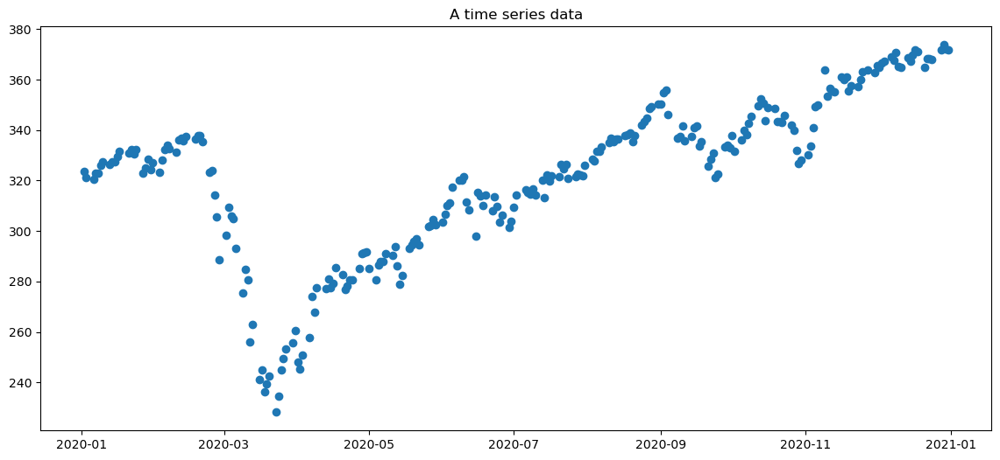

In [2]:
import pandas as pd; import datetime as dt; import matplotlib.pyplot as plt;
import yfinance as yf
import seaborn as sns
strt = dt.datetime(2020,1,1)
end = dt.datetime(2021,1,2)
data=yf.download("SPY", strt, end)
plt.figure(figsize=(14,6))
plt.scatter(data.index, data[('Open', 'SPY')])
plt.title("A time series data")
plt.show()

If we plot this in red, we can see that what we get is a moving average of the daily price, it’s like a smooth, less noisy curve.

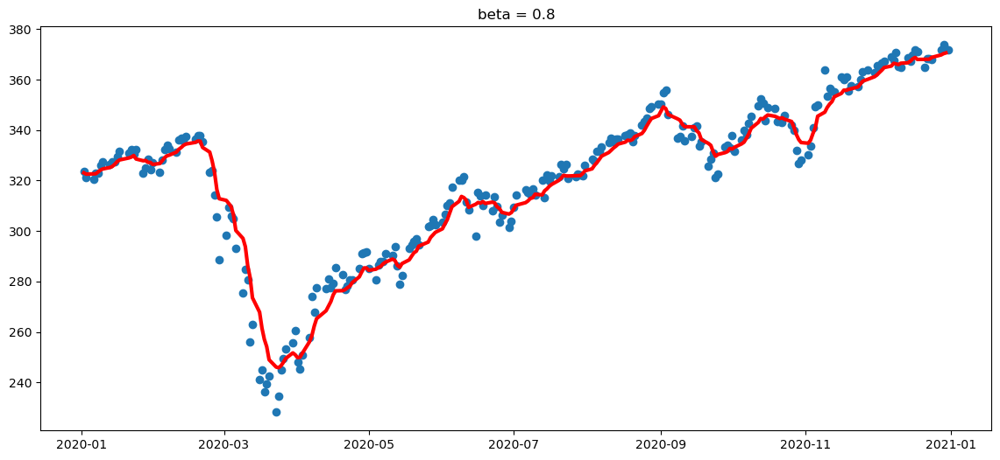

In [21]:
def momentum(data, beta=0.9):
    v_s = []
    v_prev = data[('Open', 'SPY')].iloc[0]
    for i in range(1, data.shape[0]):
        v_start = data[('Open', 'SPY')].iloc[i]
        v_new = beta * v_prev + (1-beta)*v_start
        v_s.append(v_new)
        v_prev = v_new
    return v_s
betaa = 0.8
data_1 = momentum(data, beta= betaa)
plt.figure(figsize=(14,6))
plt.scatter(data.index, data[('Open', 'SPY')])
plt.plot(data.index[:-1], data_1, linewidth=3, color='red')
plt.title(f"beta = {betaa}")
plt.show()

Comparing multiple beta values

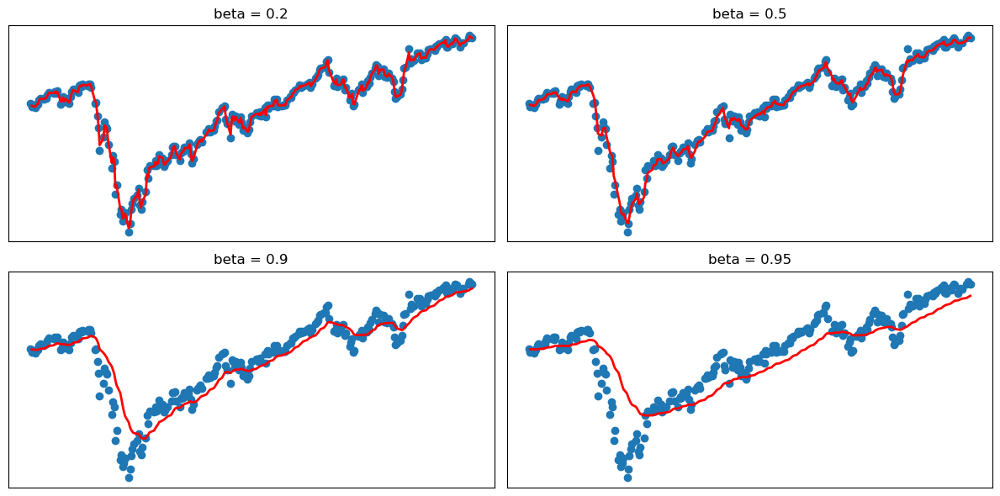

In [24]:
fig, ax = plt.subplots(2,2,figsize=(12, 6))
betas = [0.2, 0.5, 0.9, 0.95]
for i in range(len(betas)):
    ax[i//2, i%2].scatter(data.index, data[('Open', 'SPY')])
    ax[i//2, i%2].plot(data.index[1:], momentum(data, beta=betas[i]), linewidth=2, color='red')
    ax[i//2, i%2].set_title(f"beta = {betas[i]}")
    # ax[i//2, i%2].tick_params(axis='x', labelrotation=30)
    ax[i//2, i%2].set_xticks([])
    ax[i//2, i%2].set_yticks([])
plt.tight_layout()

## 6. Intuition behind EWMA
Lets explain a bit more the general equation:
$$
\large v_t = \overbrace{\beta \cdot v_{t-1}}^{\textcolor{red}{\text{trend}}} + \underbrace{(1 - \beta) \cdot x_t}_{\textcolor{red}{\text{current value}}}
$$

We can see that the value of $\beta$ determines how important the previous value is (the trend), and $(1-\beta)$ how important the current value is.<p>
Take a value of $\beta = 0.95$ and plot, notice that the curve is smoother because the trend now is more important (and the current price value is less important), so it will adapt more slowly when the price changes.<p>

Lets try the other extreme and set $\beta = 0.5$, this way the graph we get is noisier, because it is more susceptible to the current values (and this includes outliers).<br>
It adapts more quickly to recent changes in price.

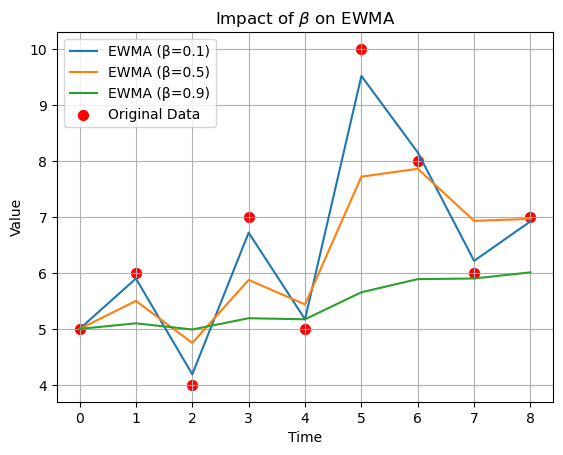

In [4]:
data = [5, 6, 4, 7, 5, 10, 8, 6, 7]
indexx = [i for i in range(len(data))]
beta_values = [0.1, 0.5, 0.9]


def ewma(data, beta):
    v = data[0] 
    ewma_values = [v]
    for x in data[1:]:
        v = beta * v + (1 - beta) * x
        ewma_values.append(v)
    return ewma_values

# Plot
for beta in beta_values:
    ewma_values = ewma(data, beta)
    plt.plot(ewma_values, label=f"EWMA (β={beta})")

plt.scatter(indexx, data, label="Original Data", marker="o", s=50, color = "red")
plt.title(r"Impact of $\beta$ on EWMA")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.grid()
plt.show()

##### Low $\beta$ (e.g., $\beta = 0.1$)

- **Behavior**:
  - Gives more weight to recent data ($1 - \beta$ is large).
  - Reacts quickly to changes or noise in the data.
  - Results in a less smooth curve that closely follows the data points.
- **Interpretation**:
  - We can think of this as "overfitting" to recent data because the moving average reflects every fluctuation, even noise.


##### High $\beta$ (e.g., $\beta = 0.9$)
- **Behavior**:
  - Gives more weight to historical data ($\beta$ is large).
  - Reacts slowly to new data points.
  - Results in a smoother curve that may lag behind significant trends.
- **Interpretation**:
  - We can think of this as "underfitting" because the moving average ignores small changes and emphasizes long-term trends.

$$\beta = \frac{2}{n+1}$$
where, $n$ = number of past data points contributing significantly to the moving average.<p>

This formula provides a way to approximate $\beta$ based on the desired "smoothing window" size ($n$).

#### Example
1. **Given $n=19$**:
    <br>
    $\beta = \frac{2}{n+1} = \frac{2}{19+1} = \frac{2}{20} = 0.1$
    <p>
    This corresponds to an EWMA with a "memory" equivalent to the last 20 data points when $\beta = 0.1$.

2. **Given $n=9$**:
    <br>
    $\beta = \frac{2}{n+1} = \frac{2}{9+1} = \frac{2}{10} = 0.5$
    <p>
    This corresponds to an EWMA with a "memory" equivalent to the last 10 data points when $\beta = 0.5$.

### Another Mathematical intuition,

We begin with the recurrence relation for the exponentially weighted moving average (EWMA):

$$
v_t = \beta \cdot v_{t-1} + (1 - \beta) \cdot x_t
$$

Where:

- $v_t$ is the moving average at time $t$,<br>
- $x_t$ is the input (e.g., gradient) at time $t$,<br>
- $\beta$ is a constant hyperparameter that controls the decay rate.<br>

Let’s explore this equation step by step:

- At $t = 0$, $v_0 = x_1$.
- At $t = 1$, the update is:

$$
v_1 \textcolor{magenta}{=} \beta \cdot v_0 + (1 - \beta) \cdot x_2 \textcolor{magenta}{=} \beta \cdot x_1 + (1 - \beta) \cdot x_2
$$

- At $t \textcolor{magenta}{=} 2$, the update is:

$$
v_2 \textcolor{magenta}{=} \beta \cdot v_1 + (1 - \beta) \cdot x_3 \textcolor{magenta}{=} \beta \cdot [\beta \cdot x_1 + (1 - \beta) \cdot x_2] + (1 - \beta) \cdot x_3
$$

Expanding this:

$$
v_2 \textcolor{magenta}{=} \beta^2 \cdot x_1 + \beta(1 - \beta) \cdot x_2 + (1 - \beta) \cdot x_3
$$

- At $t \textcolor{magenta}{=} 3$, we get:

$$
v_3 \textcolor{magenta}{=} \beta \cdot v_2 + (1 - \beta) \cdot x_4 \textcolor{magenta}{=} \beta \cdot [\beta^2 \cdot x_1 + \beta(1 - \beta) \cdot x_2 + (1 - \beta) \cdot x_3] + (1 - \beta) \cdot x_4
$$

Expanding this:

$$
v_3 \textcolor{magenta}{=} \beta^3 \cdot x_1 + \beta^2(1 - \beta) \cdot x_2 + \beta(1 - \beta) \cdot x_3 + (1 - \beta) \cdot x_4
$$

Or more compactly:

$$
v_3 \textcolor{magenta}{=} \beta^3 \cdot x_1 + (1 - \beta) \left[\beta^2 \cdot x_2 + \beta \cdot x_3 + x_4 \right]
$$

### Generalization:
For $0 < \beta < 1$, as we keep expanding the equation, it becomes clear that each new value $v_t$ is a weighted sum of all previous inputs, with exponentially decaying weights. 

Specifically, $\beta^3 < \beta^2 < \beta$, implying that the influence of older values diminishes over time. Thus, recent values (or updates in the case of deep learning optimizers) contribute more to the final result.

This behavior makes the EWMA a useful tool in optimizers like Adam, where the moving average of gradients and squared gradients is used to adjust learning rates and stabilize optimization.


## 7. Applications

1. **Time Series Analysis**:
   - Smoothing noisy data.
2. **Finance**:
   - Tracking trends in stock prices or financial metrics.
3. **Deep Learning**:
   - Used in optimizers like Adam for gradient smoothing.
4. **Process Control**:
   - Monitoring and detecting changes in production quality.

## 8. Advantages

- Simple to implement.
- Adaptive to recent changes.
- Smooths out noise effectively.

## 9. Disadvantages

- Requires tuning of $\beta$.
- Sensitive to outliers if too small.


# **Contour plots**

- A contour plot is a graphical representation used to visualize a 3D surface on a 2D plane. 
- It uses contours (lines or curves) to represent regions of constant value, making it ideal for showing the relationship between two variables and a third dependent variable.

### 1. Why?

In the context of deep learning:

1. Contour plots are often used to visualize the loss landscape during model training. This helps illustrate how the loss function changes with respect to model parameters, such as weights and biases.
2. They are helpful in understanding concepts like gradient descent, showing how optimization algorithms minimize the loss by moving through the contours.
3. They provide insights into whether the loss landscape is smooth, convex, or contains local minima, which affects the optimization process.



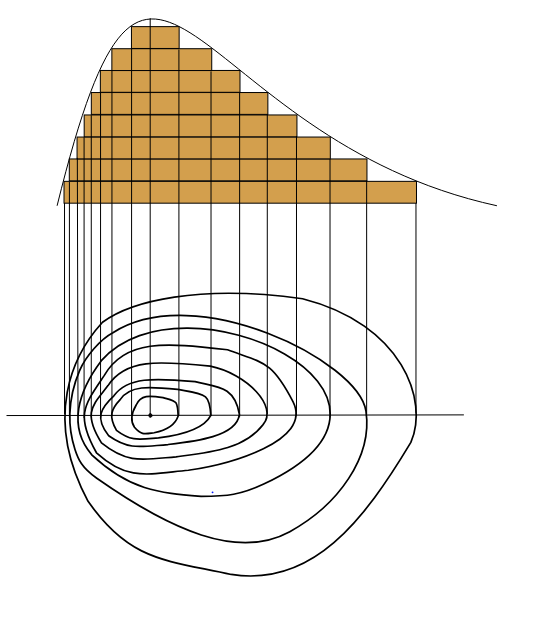

### 2. Some examples.. 

#### Contour Heatmap

In [356]:
import plotly.graph_objects as go

fig = go.Figure(data=
    go.Contour(
        z=[[10, 10.625, 12.5, 15.625, 20],
           [5.625, 6.25, 8.125, 11.25, 15.625],
           [2.5, 3.125, 5., 8.125, 12.5],
           [0.625, 1.25, 3.125, 6.25, 10.625],
           [0, 0.625, 2.5, 5.625, 10]],
        contours=dict(
            coloring ='heatmap',
            showlabels = True, # show labels on contours
            labelfont = dict( # label font properties
                size = 12,
                color = 'white',
            )
        ),
        colorbar=dict(
            title=dict(
                text='Color bar indicating dependent feature', side = 'right' ))
        ))
fig.update_layout(
    title='Contour Plot',
    xaxis_title='Independent Feature 1',
    yaxis_title='Independent Feature 2',
    width=800, height=400,
    margin=dict(l=10, r=10, t=40, b=20)
)
fig.show()

#### Contour Lines

In [355]:
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
init_notebook_mode(connected=True)
cf.go_offline()
fig = go.Figure(data=
    go.Contour(
        z=[[10, 10.625, 12.5, 15.625, 20],
           [5.625, 6.25, 8.125, 11.25, 15.625],
           [2.5, 3.125, 5., 8.125, 12.5],
           [0.625, 1.25, 3.125, 6.25, 10.625],
           [0, 0.625, 2.5, 5.625, 10]],
        contours_coloring='lines',
        line_width=2,
        colorbar=dict(
            title=dict(
                text='Color Lines', side = 'right' ))
    )
)
fig.update_layout(
    title='Contour Lines indicating Dependent feature',
    xaxis_title='Independent Feature 1',
    yaxis_title='Independent Feature 2',
    width=800, height=400, template='ggplot2',
    margin=dict(l=10, r=10, t=40, b=20)
)
fig.show()

#### Contour of Convex Function

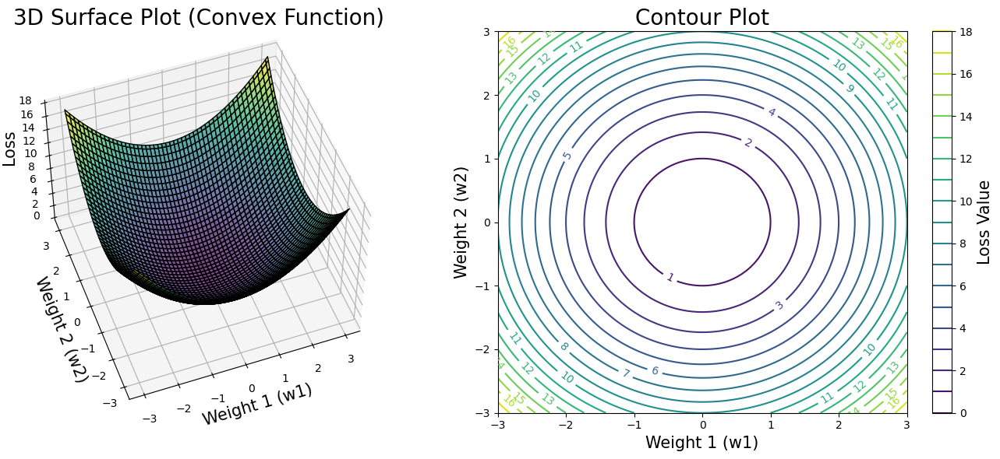

In [366]:
import numpy as np
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D

# Define the quadratic loss function
def loss_function(w1, w2):
    return w1**2 + w2**2

# Generate grid data
w1 = np.linspace(-3, 3, 100)
w2 = np.linspace(-3, 3, 100)
W1, W2 = np.meshgrid(w1, w2)
Z = loss_function(W1, W2)

# Create the plots
fig = plt.figure(figsize=(14, 6))

# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z, cmap='viridis', edgecolor='k', alpha=0.7)
ax1.set_title("3D Surface Plot (Convex Function)", size=20)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss", rotation = 90,size = 15)
ax1.view_init(elev=50, azim=250)

# Contour Plot
ax2 = fig.add_subplot(1, 2, 2)
contours = ax2.contour(W1, W2, Z, levels=20, cmap='viridis')
ax2.clabel(contours, inline=True, fontsize=10)
ax2.set_title("Contour Plot", size=20)
ax2.set_xlabel("Weight 1 (w1)",size = 15)
ax2.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(contours, ax=ax2).set_label(label="Loss Value", size=15)

plt.tight_layout()
plt.show()


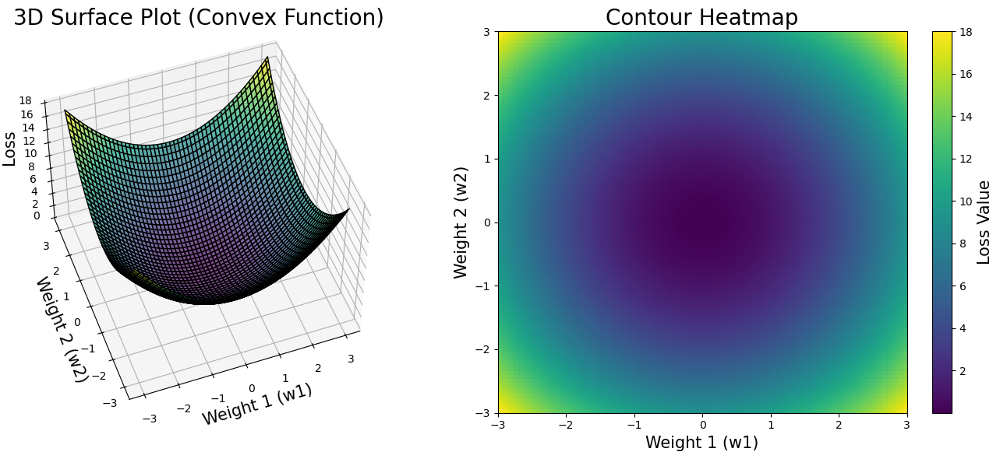

In [345]:
import numpy as np
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D

# Define the quadratic loss function
def loss_function(w1, w2):
    return w1**2 + w2**2

# Generate grid data
w1 = np.linspace(-3, 3, 100)
w2 = np.linspace(-3, 3, 100)
W1, W2 = np.meshgrid(w1, w2)
Z = loss_function(W1, W2)

# Create the plots
fig = plt.figure(figsize=(14, 6))

# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z, cmap='viridis', edgecolor='k', alpha=0.7)
ax1.set_title("3D Surface Plot (Convex Function)", size = 20)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss",size = 15, rotation = 90)
ax1.view_init(elev=50, azim=250)



# Contour Heatmap
ax3 = fig.add_subplot(1, 2, 2)
heatmap = ax3.imshow(Z, extent=(-3, 3, -3, 3), origin='lower', cmap='viridis', aspect='auto')
ax3.set_title("Contour Heatmap", size = 20)
ax3.set_xlabel("Weight 1 (w1)",size = 15)
ax3.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(heatmap, ax=ax3).set_label(label="Loss Value", size=15)

plt.tight_layout()
plt.show()


#### Contour of a Non-Convex Function

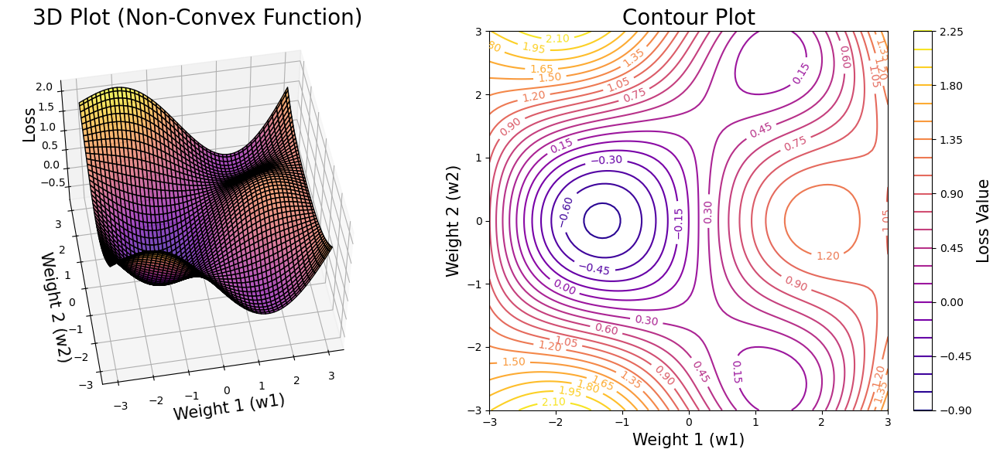

In [348]:
# Define the non-convex loss function
def non_convex_loss(w1, w2):
    return np.sin(w1) * np.cos(w2) + 0.1 * (w1**2 + w2**2)

# Generate grid data
Z_nonconvex = non_convex_loss(W1, W2)

# Create the plots
fig = plt.figure(figsize=(14, 6))


# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z_nonconvex, cmap='plasma', edgecolor='k', alpha=0.7)
ax1.set_title("3D Plot (Non-Convex Function)", size=20)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss",size = 15, rotation=90)
ax1.view_init(elev=50, azim=260)
# Contour Plot
ax2 = fig.add_subplot(1, 2, 2)
contours = ax2.contour(W1, W2, Z_nonconvex, levels=20, cmap='plasma')
ax2.clabel(contours, inline=True, fontsize=10)
ax2.set_title("Contour Plot", size=20)
ax2.set_xlabel("Weight 1 (w1)",size = 15)
ax2.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(contours, ax=ax2).set_label(label="Loss Value", size=15)

plt.tight_layout()
plt.show()


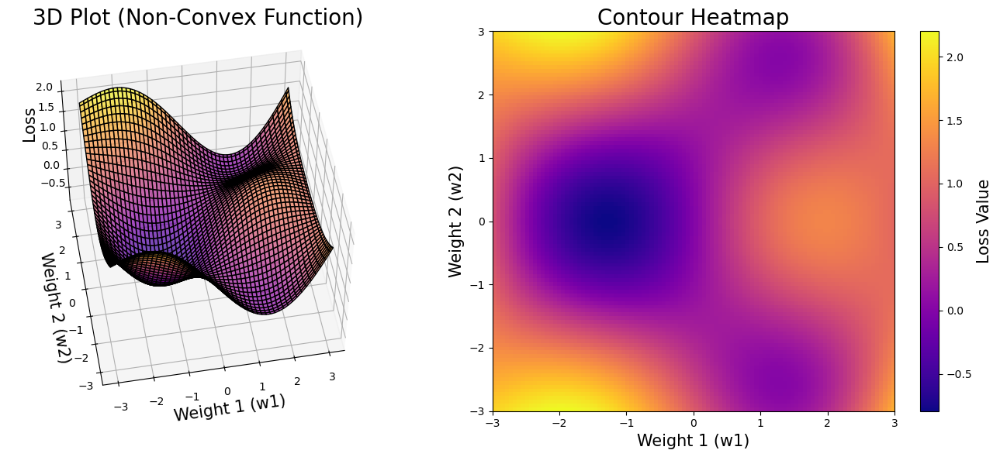

In [346]:
# Define the non-convex loss function
def non_convex_loss(w1, w2):
    return np.sin(w1) * np.cos(w2) + 0.1 * (w1**2 + w2**2)

# Generate grid data
Z_nonconvex = non_convex_loss(W1, W2)

# Create the plots
fig = plt.figure(figsize=(14, 6))


# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z_nonconvex, cmap='plasma', edgecolor='k', alpha=0.7)
ax1.set_title("3D Plot (Non-Convex Function)", size=20)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss",size = 15, rotation=90)
ax1.view_init(elev=50, azim=260)

# Contour Plot
ax3 = fig.add_subplot(1, 2, 2)
heatmap = ax3.imshow(Z_nonconvex, extent=(-3, 3, -3, 3), origin='lower', cmap='plasma', aspect='auto')
ax3.set_title("Contour Heatmap", size=20)
ax3.set_xlabel("Weight 1 (w1)",size = 15)
ax3.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(heatmap, ax=ax3).set_label("Loss Value", size=15)

plt.tight_layout()
plt.show()


#### Contour of Saddle point

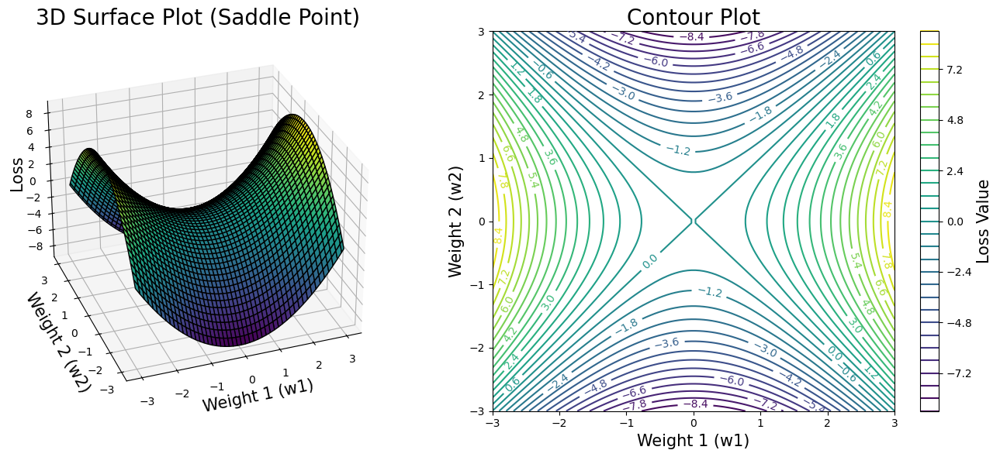

In [370]:
# Define the loss function for a saddle point
def saddle_point_loss(w1, w2):
    return w1**2 - w2**2  # Simple saddle point function

# Generate grid data
Z_saddle = saddle_point_loss(W1, W2)

# Create the plots
fig = plt.figure(figsize=(14, 6))

# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z_saddle, cmap='viridis', edgecolor='k', alpha=1)
ax1.set_title("3D Surface Plot (Saddle Point)",size = 20)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss", labelpad=0, rotation=90,size = 15)
ax1.view_init(elev=30, azim=250)

# Contour Plot
ax2 = fig.add_subplot(1, 2, 2)
contours = ax2.contour(W1, W2, Z_saddle, levels=30, cmap='viridis')
ax2.clabel(contours, inline=True, fontsize=10)
ax2.set_title("Contour Plot",size = 20)
ax2.set_xlabel("Weight 1 (w1)",size = 15)
ax2.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(contours, ax=ax2).set_label("Loss Value", size = 15)

plt.tight_layout()
plt.show()


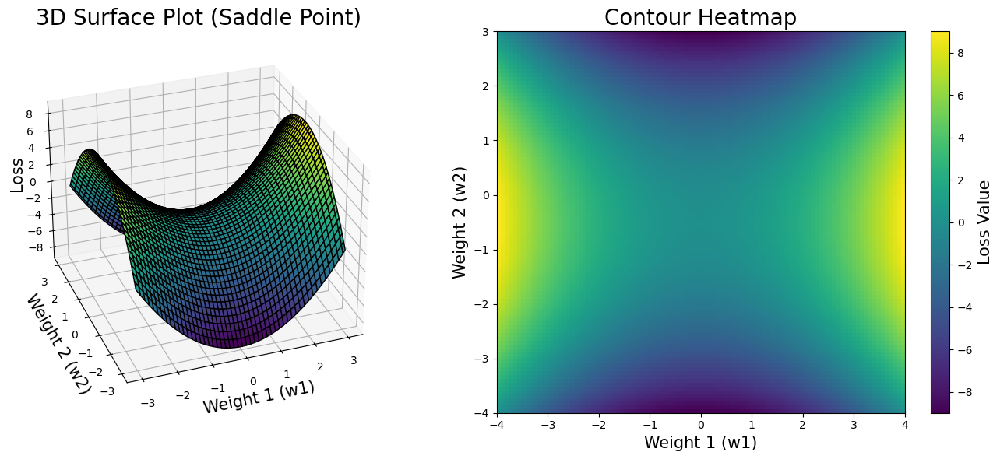

In [372]:
# Define the loss function for a saddle point
def saddle_point_loss(w1, w2):
    return w1**2 - w2**2  # Simple saddle point function

# Generate grid data
Z_saddle = saddle_point_loss(W1, W2)

# Create the plots
fig = plt.figure(figsize=(14, 6))

# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z_saddle, cmap='viridis', edgecolor='k', alpha=1)
ax1.set_title("3D Surface Plot (Saddle Point)",size = 20)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss", labelpad=0, rotation=90,size = 15)
ax1.view_init(elev=30, azim=250)

# Contour Plot
ax3 = fig.add_subplot(1, 2, 2)
heatmap = ax3.imshow(Z_saddle, extent=(-4, 4, -4, 3), origin='lower', cmap='viridis', aspect='auto')
ax3.set_title("Contour Heatmap",size = 20)
ax3.set_xlabel("Weight 1 (w1)",size = 15)
ax3.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(heatmap, ax=ax3).set_label("Loss Value", size = 15)

plt.tight_layout()
plt.show()


#### Contour of Plateau

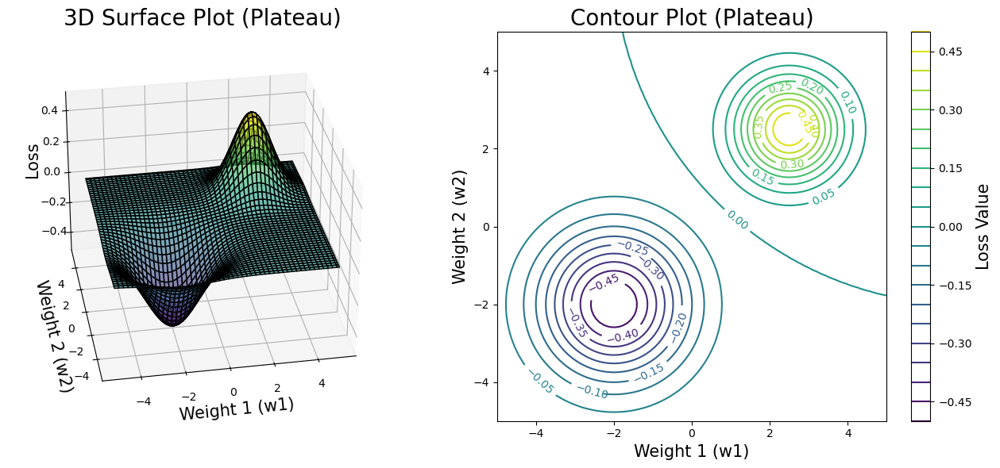

In [395]:
# Define the loss function for a plateau
def plateau_loss(x, y):
    z = np.zeros_like(x)
    trough_x, trough_y = -2, -2  # Center of the trough
    z -= 0.5 * np.exp(-0.3 * ((x - trough_x)**2 + (y - trough_y)**2))  # Trough
    crest_x, crest_y = 2.5, 2.5  # Center of the crest
    z += 0.5 * np.exp(-0.6 * ((x - crest_x)**2 + (y - crest_y)**2))  # Crest
    return z

# Generate grid data
w1 = np.linspace(-5, 5, 100)
w2 = np.linspace(-5, 5, 100)
W1, W2 = np.meshgrid(w1, w2)
Z_plateau = plateau_loss(W1, W2)

# Create the plots
fig = plt.figure(figsize=(13.5,6))

# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z_plateau, cmap='viridis', edgecolor='k', alpha=0.6)
ax1.view_init(elev=30, azim=260, roll=0)
ax1.set_title("3D Surface Plot (Plateau)",size = 20)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss",size = 15, rotation=90)

# Contour Plot
ax2 = fig.add_subplot(1, 2, 2)
contours = ax2.contour(W1, W2, Z_plateau, levels=20, cmap='viridis')
ax2.clabel(contours, inline=True, fontsize=10)
ax2.set_title("Contour Plot (Plateau)",size = 20)
ax2.set_xlabel("Weight 1 (w1)",size = 15)
ax2.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(contours, ax=ax2).set_label("Loss Value", size = 15)

plt.tight_layout()
plt.show()


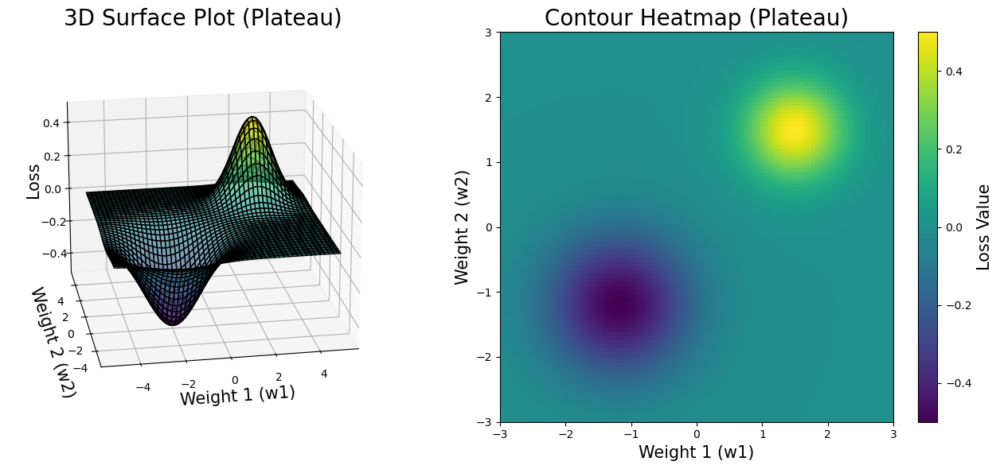

In [396]:
# Define the loss function for a plateau
def plateau_loss(x, y):
    z = np.zeros_like(x)
    trough_x, trough_y = -2, -2  # Center of the trough
    z -= 0.5 * np.exp(-0.3 * ((x - trough_x)**2 + (y - trough_y)**2))  # Trough
    crest_x, crest_y = 2.5, 2.5  # Center of the crest
    z += 0.5 * np.exp(-0.6 * ((x - crest_x)**2 + (y - crest_y)**2))  # Crest
    return z

# Generate grid data
w1 = np.linspace(-5, 5, 100)
w2 = np.linspace(-5, 5, 100)
W1, W2 = np.meshgrid(w1, w2)
Z_plateau = plateau_loss(W1, W2)

# Create the plots
fig = plt.figure(figsize=(13.5,6))

# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z_plateau, cmap='viridis', edgecolor='k', alpha=0.6)
ax1.view_init(elev=20, azim=260, roll=0)
ax1.set_title("3D Surface Plot (Plateau)",size = 20)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss",size = 15, rotation=90)

# Contour Plot
ax3 = fig.add_subplot(1, 2,2)
heatmap = ax3.imshow(Z_plateau, extent=(-3, 3, -3, 3), origin='lower', cmap='viridis', aspect='auto')
ax3.set_title("Contour Heatmap (Plateau)",size = 20)
ax3.set_xlabel("Weight 1 (w1)",size = 15)
ax3.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(heatmap, ax=ax3).set_label("Loss Value", size = 15)

plt.tight_layout()
plt.show()


#### Contour of a High Curvature Loss function

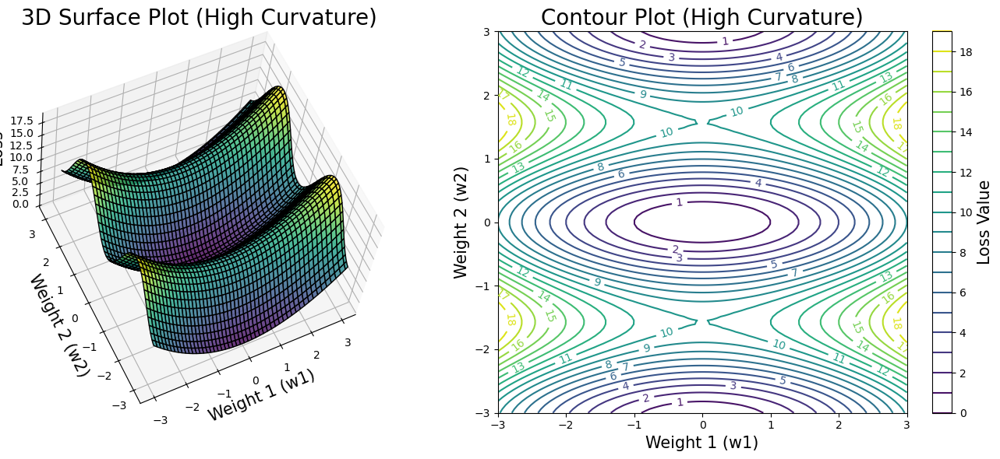

In [393]:
# Define the high curvature loss function
def high_curvature_loss(w1, w2):
    return w1**2 + 10 * np.sin(w2)**2

# Generate grid data
w1 = np.linspace(-3, 3, 100)
w2 = np.linspace(-3, 3, 100)
W1, W2 = np.meshgrid(w1, w2)
Z_high_curvature = high_curvature_loss(W1, W2)

# Create the plots
fig = plt.figure(figsize=(14, 6))

# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z_high_curvature, cmap='viridis', edgecolor='k', alpha=0.8)
ax1.set_title("3D Surface Plot (High Curvature)",size = 20)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss",size = 15, rotation = 90)
ax1.view_init(60, 235, -10)

# Contour Plot
ax2 = fig.add_subplot(1, 2, 2)
contours = ax2.contour(W1, W2, Z_high_curvature, levels=20, cmap='viridis')
ax2.clabel(contours, inline=True, fontsize=10)
ax2.set_title("Contour Plot (High Curvature)",size = 20)
ax2.set_xlabel("Weight 1 (w1)",size = 15)
ax2.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(contours, ax=ax2).set_label("Loss Value", size = 15)

plt.tight_layout()
plt.show()


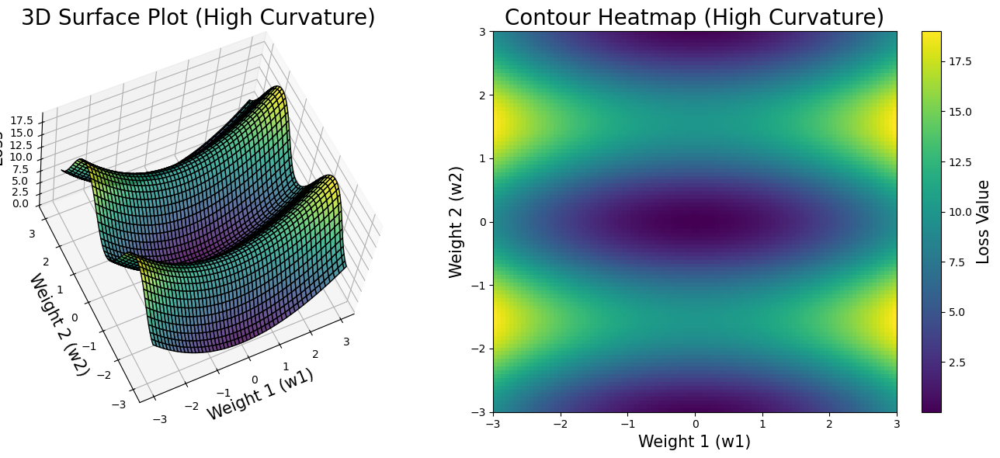

In [392]:
# Define the high curvature loss function
def high_curvature_loss(w1, w2):
    return w1**2 + 10 * np.sin(w2)**2

# Generate grid data
w1 = np.linspace(-3, 3, 100)
w2 = np.linspace(-3, 3, 100)
W1, W2 = np.meshgrid(w1, w2)
Z_high_curvature = high_curvature_loss(W1, W2)

# Create the plots
fig = plt.figure(figsize=(14, 6))

# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z_high_curvature, cmap='viridis', edgecolor='k', alpha=0.8)
ax1.set_title("3D Surface Plot (High Curvature)",size = 20)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss",size = 15, rotation = 90)
ax1.view_init(60, 235, -10)

# Contour Plot
ax3 = fig.add_subplot(1, 2, 2)
heatmap = ax3.imshow(Z_high_curvature, extent=(-3, 3, -3, 3), origin='lower', cmap='viridis', aspect='auto')
ax3.set_title("Contour Heatmap (High Curvature)",size = 20)
ax3.set_xlabel("Weight 1 (w1)",size = 15)
ax3.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(heatmap, ax=ax3).set_label("Loss Value", size = 15)

plt.tight_layout()
plt.show()


#### Contour of a complex loss surface

##### (i) Surface 1

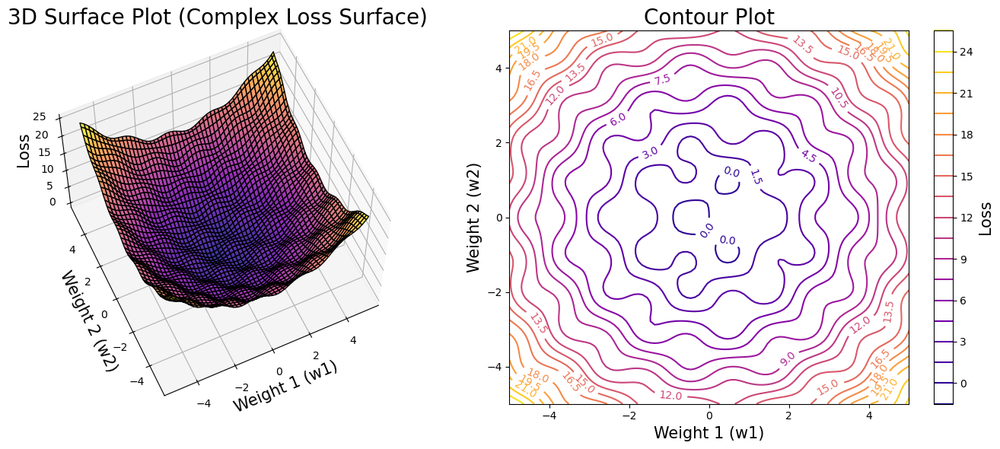

In [403]:
# Define the complex loss function
def complex_loss(w1, w2):
    return np.sin(3 * w1) * np.cos(3 * w2) + 0.5 * (w1**2 + w2**2)

# Generate grid data
Z_complex = complex_loss(W1, W2)

# Create the plots
fig = plt.figure(figsize=(14, 6))

# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z_complex, cmap='plasma', edgecolor='k', alpha=0.8)
ax1.set_title("3D Surface Plot (Complex Loss Surface)",size = 20)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss",size = 15, rotation=90)
ax1.view_init(60, 245)

# Contour Plot
ax2 = fig.add_subplot(1, 2, 2)
contours = ax2.contour(W1, W2, Z_complex, levels=20, cmap='plasma')
ax2.clabel(contours, inline=True, fontsize=10)
ax2.set_title("Contour Plot",size = 20)
ax2.set_xlabel("Weight 1 (w1)",size = 15)
ax2.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(contours, ax=ax2).set_label("Loss", size=15)

plt.tight_layout()
plt.show()


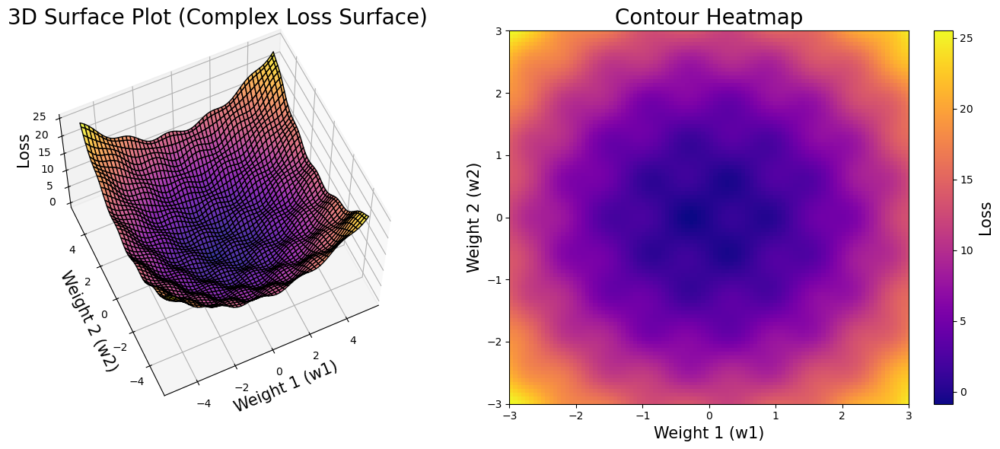

In [402]:
# Define the complex loss function
def complex_loss(w1, w2):
    return np.sin(3 * w1) * np.cos(3 * w2) + 0.5 * (w1**2 + w2**2)

# Generate grid data
Z_complex = complex_loss(W1, W2)

# Create the plots
fig = plt.figure(figsize=(14, 6))

# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z_complex, cmap='plasma', edgecolor='k', alpha=0.8)
ax1.set_title("3D Surface Plot (Complex Loss Surface)",size = 20)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss",size = 15, rotation=90)
ax1.view_init(60, 245)

# Contour Plot
ax3 = fig.add_subplot(1, 2, 2)
heatmap = ax3.imshow(Z_complex, extent=(-3, 3, -3, 3), origin='lower', cmap='plasma', aspect='auto')
ax3.set_title("Contour Heatmap",size = 20)
ax3.set_xlabel("Weight 1 (w1)",size = 15)
ax3.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(heatmap, ax=ax3).set_label("Loss", size=15)

plt.tight_layout()
plt.show()


##### (ii) Surface 2

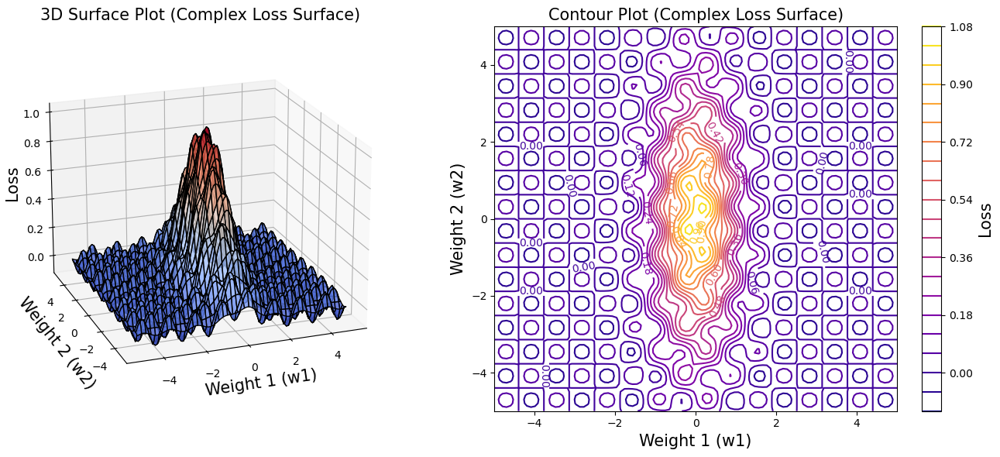

In [412]:
# Define the sharp and flat minima loss function
def sharp_flat_loss(w1, w2):
    return np.exp(-w1**2 - 0.1*w2**2) + 0.1 * np.sin(5 * w1) * np.sin(5 * w2)

# Generate grid data
Z_sharp_flat = sharp_flat_loss(W1, W2)

# Create the plots
fig = plt.figure(figsize=(14, 6))

# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z_sharp_flat, cmap='coolwarm', edgecolor='k', alpha=0.8)
ax1.set_title("3D Surface Plot (Complex Loss Surface)",size = 15)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss",size = 15, rotation=90)
ax1.view_init(20, 250)


# Contour Plot
ax2 = fig.add_subplot(1, 2, 2)
contours = ax2.contour(W1, W2, Z_sharp_flat, levels=20, cmap='plasma')
ax2.clabel(contours, inline=True, fontsize=10)
ax2.set_title("Contour Plot (Complex Loss Surface)",size = 15)
ax2.set_xlabel("Weight 1 (w1)",size = 15)
ax2.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(contours, ax=ax2).set_label("Loss", size=15)

plt.tight_layout()
plt.show()

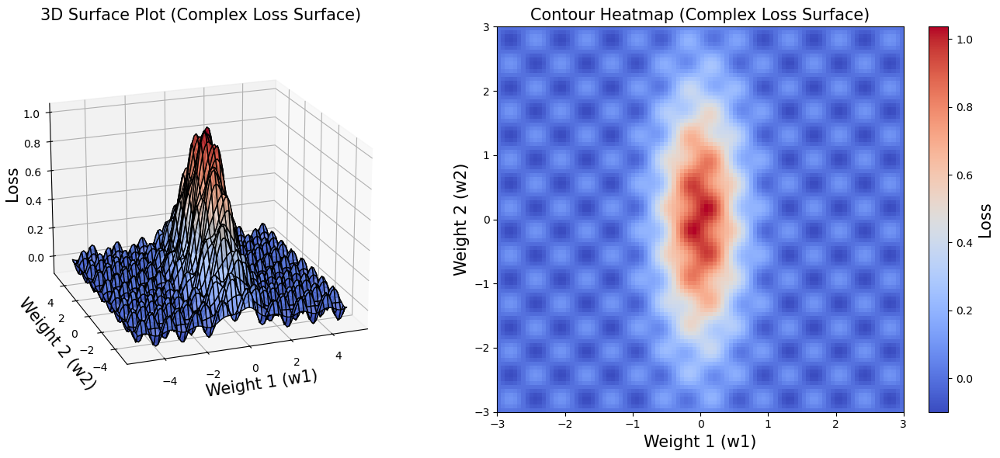

In [413]:
# Define the sharp and flat minima loss function
def sharp_flat_loss(w1, w2):
    return np.exp(-w1**2 - 0.1*w2**2) + 0.1 * np.sin(5 * w1) * np.sin(5 * w2)

# Generate grid data
Z_sharp_flat = sharp_flat_loss(W1, W2)

# Create the plots
fig = plt.figure(figsize=(14, 6))

# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z_sharp_flat, cmap='coolwarm', edgecolor='k', alpha=0.8)
ax1.set_title("3D Surface Plot (Complex Loss Surface)",size = 15)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss",size = 15, rotation=90)
ax1.view_init(20, 250)

# Heatmap Plot
ax3 = fig.add_subplot(1, 2, 2)
heatmap = ax3.imshow(Z_sharp_flat, extent=(-3, 3, -3, 3), origin='lower', cmap='coolwarm', aspect='auto')
ax3.set_title("Contour Heatmap (Complex Loss Surface)",size = 15)
ax3.set_xlabel("Weight 1 (w1)",size = 15)
ax3.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(heatmap, ax=ax3).set_label("Loss", size=15)

plt.tight_layout()
plt.show()

#### Contour with Gradient Descent Path

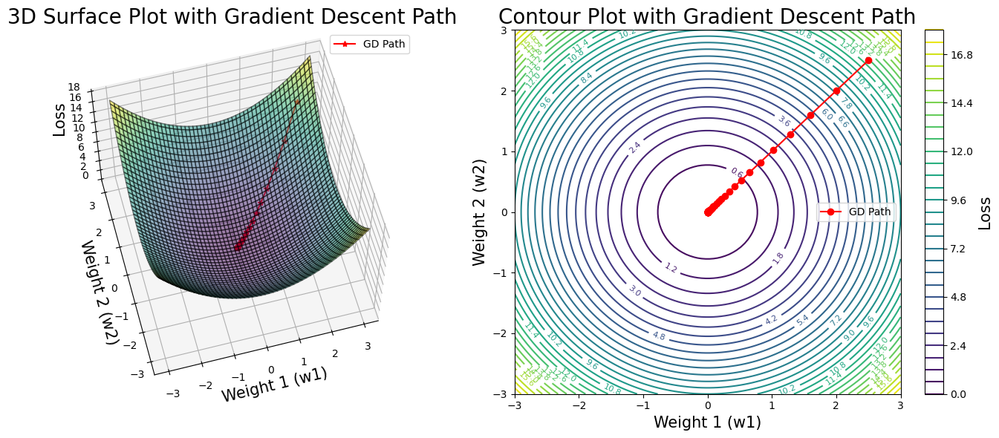

In [420]:
import numpy as np
import matplotlib.pyplot as plt

# Define a loss function
def loss_function(w1, w2):
    return w1**2 + w2**2 

# Gradient of the loss function
def gradient(w1, w2):
    grad_w1 = 2 * w1 
    grad_w2 = 2 * w2 
    return np.array([grad_w1, grad_w2])

# Gradient Descent Parameters
learning_rate = 0.1
max_iter = 50
tolerance = 1e-5

# Starting point
w = np.array([2.5, 2.5])  # Initial weights
trajectory = [w.copy()]  # To store the path of gradient descent

# Perform gradient descent
for i in range(max_iter):
    grad = gradient(w[0], w[1])
    w -= learning_rate * grad
    trajectory.append(w.copy())
    # if np.linalg.norm(grad) < tolerance:
    #     break

trajectory = np.array(trajectory)

# Generate grid data for plotting
w1 = np.linspace(-3, 3, 100)
w2 = np.linspace(-3, 3, 100)
W1, W2 = np.meshgrid(w1, w2)
Z = loss_function(W1, W2)

# Create the plots
fig = plt.figure(figsize=(14, 6))

# 3D Surface Plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W1, W2, Z, alpha=0.5, edgecolor='k', cmap='viridis')
ax1.view_init(elev=60, azim=255,roll =0)
ax1.set_title("3D Surface Plot with Gradient Descent Path",size = 20)
ax1.set_xlabel("Weight 1 (w1)",size = 15)
ax1.set_ylabel("Weight 2 (w2)",size = 15)
ax1.set_zlabel("Loss", rotation=90,size = 15)

# Plot gradient descent path in 3D
trajectory_z = loss_function(trajectory[:, 0], trajectory[:, 1])
ax1.plot(trajectory[:, 0], trajectory[:, 1], trajectory_z, color='red', marker='*', label="GD Path", alpha=1)
ax1.legend()

# Contour Plot
ax2 = fig.add_subplot(1, 2, 2)
contour = ax2.contour(W1, W2, Z, levels=30, cmap='viridis')
ax2.clabel(contour, inline=True, fontsize=8)
ax2.set_title("Contour Plot with Gradient Descent Path",size = 20)
ax2.set_xlabel("Weight 1 (w1)",size = 15)
ax2.set_ylabel("Weight 2 (w2)",size = 15)
plt.colorbar(contour, ax=ax2).set_label("Loss", size=15)
# Plot gradient descent path on contour plot
ax2.plot(trajectory[:, 0], trajectory[:, 1], color='red', marker='o', label="GD Path")
ax2.legend()

plt.tight_layout()
plt.show()


# **Momentum Gradient Descent**


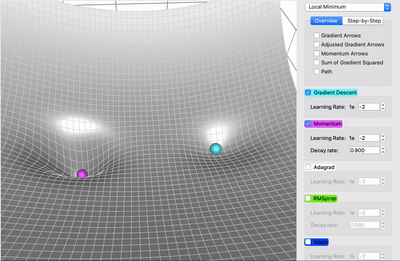

Gradient Descent (GD) is a foundational optimization algorithm in machine learning. However, **Momentum Gradient Descent** improves upon it by addressing some of its weaknesses, such as slow convergence and oscillations. Let’s understand **why we need it**, **what it is**, and **how it works** in detail.

---

## 1. Why Do We Need Momentum Gradient Descent?

### Problems with Standard Gradient Descent
1. **Oscillations in High Curvature Regions**:
   - When the loss function has steep valleys (high curvature), standard gradient descent oscillates back and forth because gradients are large in steep directions.
   - This slows down convergence and wastes computation.


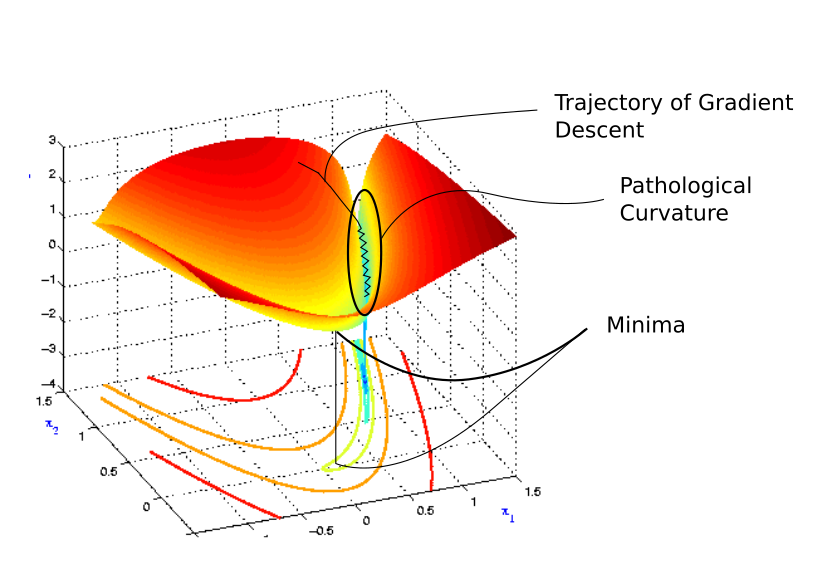

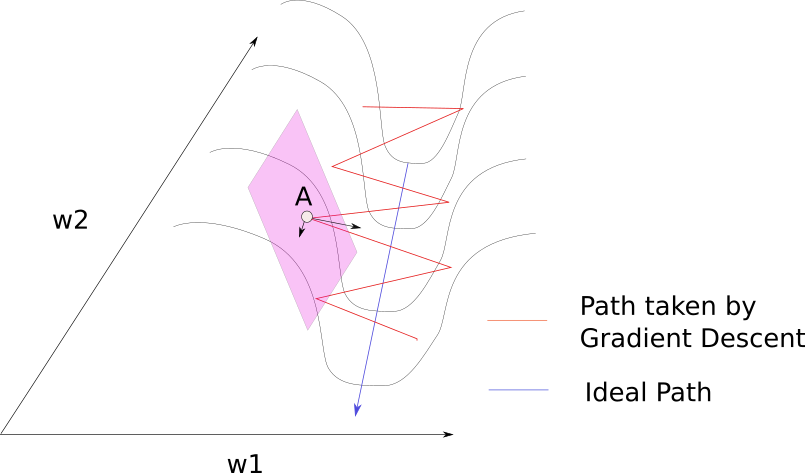


2. **Slow Convergence in Flat Regions**:
   - In regions with low gradient values (flat areas), gradient descent moves very slowly.

### Real-Life Analogy 📦
Imagine you’re rolling a ball down a mountain:

- **Standard Gradient Descent**: The ball moves **only in the direction of the slope** at that point. If the slope changes frequently, the ball will zigzag (oscillate) and move inefficiently.
- **Momentum**: The ball builds up **velocity** (speed + direction) based on previous slopes. Even when the slope temporarily flattens, the ball keeps moving due to its accumulated momentum.

Momentum helps **accelerate learning** and **smooth out oscillations**.

## 2. What is Momentum Gradient Descent?

Momentum Gradient Descent modifies standard gradient descent by introducing a **velocity term**. This term considers the **past gradients** (historical information) to decide the direction and speed of the parameter updates.

It is an optimization algorithm that builds upon standard gradient descent to accelerate convergence, especially in scenarios involving noisy gradients or valleys in the loss surface. 

In simpler terms:
- Standard GD moves using just the current gradient.
- Momentum GD combines **past gradients** (momentum) with the current gradient.


## 3. How Does Momentum Gradient Descent Work?

Momentum Gradient Descent smoothens parameter updates by introducing a **velocity term** that accumulates past gradients and applies an **exponentially weighted moving average (EWMA)**:

### **Formulas**

1. **Velocity Update**:
   $$
   \boldsymbol{\large v_t = \beta \cdot v_{t-1} + \eta \cdot \nabla J(\theta_t)}
   $$
   - $v_t$ : Velocity at time step $t$ (the exponentially decaying average of past gradients). Also called **Momentum**
   - $\beta$ : Momentum coefficient (e.g., 0.9), controls how much of the past velocity is retained.
   - $\eta$ : Learning rate.
   - $\nabla J(\theta_t)$ : Gradient of the loss function at $\theta_t$.

2. **Parameter Update**:
   $$
   \boldsymbol{\large \theta_{t+1} = \theta_t - v_t}
   $$
   - $\theta_t$ : Current parameters.
   - $v_t$ : Velocity term.



### **Explanation of Terms**
- **Momentum Coefficient ($\beta$)**: Determines how much past gradients (momentum) contribute to the update.
   - High $\beta$ (e.g., 0.9): Updates depend **heavily** on past gradients (smoother but slower to adapt).
   - Low $\beta$: Updates depend more on the current gradient (similar to standard GD).

- **Velocity ($v_t$)**: Accumulates gradients over time, building "momentum" in a particular direction.



## 4. 📈 Numerical Example

Suppose for a loss function  $L = \large \theta^2$:

- Initial parameter: $\theta_0 = 10$
- Learning rate $(\eta) = 0.1$
- Momentum coefficient $(\beta) = 0.5$
- Gradient at each step: $(2 \times \theta)$



### Step-by-Step Calculation:

<table>
<tr>
<th>

Step $t$</th>
<th>

Gradient $\nabla J(\theta_t)$</th>
<th>

Velocity $v_t$ (EWMA)</th>
<th>

Parameter $\theta_t$</th>
</tr>
<tr>
<td>0</td>
<td>

$\nabla J(\theta_0) = 2 \times 10 = 20$</td>
<td>

$v_0 = 0$</td>
<td>

$\theta_0 = 10$</td>
</tr>
<tr>
<td>1</td>
<td>

$\nabla J(\theta_1) = 2 \times 10 = 20$</td>
<td>

$v_1 = 0.5 \times 0 + 0.1 \times 20 = 2$</td>
<td>

$\theta_1 = 10 - 2 = 8$</td>
</tr>
<tr>
<td>2</td>
<td>

$\nabla J(\theta_2) = 2 \times 8 = 16$</td>
<td>

$v_2 = 0.5 \times 2 + 0.1 \times 16 = 2.6$</td>
<td>

$\theta_2 = 8 - 2.6 = 5.4$</td>
</tr>
<tr>
<td>3</td>
<td>

$\nabla J(\theta_3) = 2 \times 5.4 = 10.8$</td>
<td>

$v_3 = 0.5 \times 2.6 + 0.1 \times 10.8 = 2.38$</td>
<td>

$\theta_3 = 5.4 - 2.38 = 3.02$</td>
</tr>
<tr>
<td>4</td>
<td>

$\nabla J(\theta_4) = 2 \times 3.02 = 6.04$</td>
<td>

$v_4 = 0.5 \times 2.38 + 0.1 \times 6.04 = 1.794$</td>
<td>

$\theta_4 = 3.02 - 1.794 = 1.226$</td>
</tr>
</table>




## 5. Comparing Momentum Gradient Descent

##### **Momentum GD**

In [167]:
#| code-fold: false

def gradient(theta):
    return 2 * theta  # Gradient of the loss function J(theta) = theta^2

def loss_function(theta):
    return theta ** 2  # Loss function J(theta) = theta^2

def momentum_gd_ewma(theta_init, learning_rate, beta, num_steps):
    theta = theta_init
    v = 0  # Initialize velocity (EWMA starts at 0)
    history = []

    for step in range(num_steps):
        grad = gradient(theta)
        v = beta * v + learning_rate * grad  # EWMA formula for momentum
        theta -= v
        loss = loss_function(theta)  # Calculate loss
        history.append(theta)
        print(f"Step {step+1}: Parameter = {theta:.4f}, Loss = {loss:.4f}")
        if loss < 1e-2:  # Stop if loss is very small
            break
    return None

# Parameters
theta_initial = 10
learning_rate = 0.1
beta_1 = 0.5
steps = 50

# Run the Momentum Gradient Descent
momentum_gd_ewma(theta_initial, learning_rate, beta_1, steps)


Step 1: Parameter = 8.0000, Loss = 64.0000
Step 2: Parameter = 5.4000, Loss = 29.1600
Step 3: Parameter = 3.0200, Loss = 9.1204
Step 4: Parameter = 1.2260, Loss = 1.5031
Step 5: Parameter = 0.0838, Loss = 0.0070


##### **Batch GD**

In [168]:
#| code-fold: false

theta_initial = 10
learning_rate = 0.1
beta_1 = 0 # making GD like Batch GD
steps = 50

# Run the Momentum Gradient Descent
momentum_gd_ewma(theta_initial, learning_rate, beta_1, steps)

Step 1: Parameter = 8.0000, Loss = 64.0000
Step 2: Parameter = 6.4000, Loss = 40.9600
Step 3: Parameter = 5.1200, Loss = 26.2144
Step 4: Parameter = 4.0960, Loss = 16.7772
Step 5: Parameter = 3.2768, Loss = 10.7374
Step 6: Parameter = 2.6214, Loss = 6.8719
Step 7: Parameter = 2.0972, Loss = 4.3980
Step 8: Parameter = 1.6777, Loss = 2.8147
Step 9: Parameter = 1.3422, Loss = 1.8014
Step 10: Parameter = 1.0737, Loss = 1.1529
Step 11: Parameter = 0.8590, Loss = 0.7379
Step 12: Parameter = 0.6872, Loss = 0.4722
Step 13: Parameter = 0.5498, Loss = 0.3022
Step 14: Parameter = 0.4398, Loss = 0.1934
Step 15: Parameter = 0.3518, Loss = 0.1238
Step 16: Parameter = 0.2815, Loss = 0.0792
Step 17: Parameter = 0.2252, Loss = 0.0507
Step 18: Parameter = 0.1801, Loss = 0.0325
Step 19: Parameter = 0.1441, Loss = 0.0208
Step 20: Parameter = 0.1153, Loss = 0.0133
Step 21: Parameter = 0.0922, Loss = 0.0085


Here,

- With momentum ($\beta=0.5$), the algorithm "remembers" the previous gradients and accelerates the descent, converging in 5 steps.
- Without momentum ($\beta=0$), each step is based solely on the current gradient, so it converges more slowly, taking 21 steps.

The optimizer is able to "skip over" areas where the gradient changes direction frequently, enabling faster progress.

* The addition of momentum significantly speeds up convergence in gradient descent.
* When momentum is used, past gradients help the algorithm move faster, especially in the directions where the gradient is consistently large.

##### **Convergance Time taken**

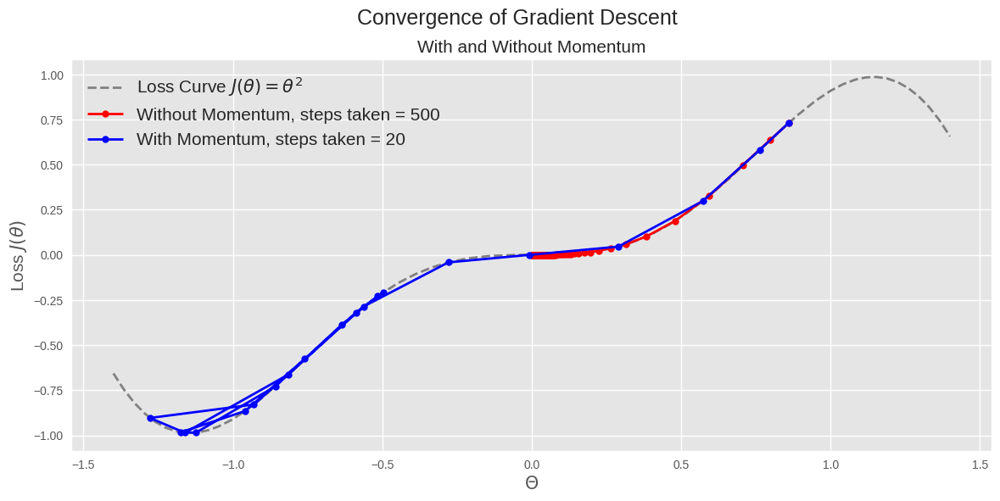

In [72]:
import numpy as np
import matplotlib.pyplot as plt

# Define the gradient and loss function
def gradient(theta):
    return 2* -theta**2 * (np.sin(theta))**2 + 2*theta*np.cos(theta)*np.sin(theta) + theta**2 * (np.cos(theta))**2  # Gradient of the loss function J(theta) = theta^2

def loss_function(theta):
    return 2*(theta ** 2)* np.sin(theta) * np.cos(theta)  # Loss function J(theta) = theta^2

# Gradient Descent without Momentum
def gd_no_momentum(theta_init, learning_rate, num_steps):
    theta = theta_init
    history = []
    for step in range(num_steps):
        grad = gradient(theta)
        theta -= learning_rate * grad
        history.append(theta)
        # if loss_function(theta) < 1e-2:  # Stop if loss is very small
        #     break
    return np.array(history)

# Gradient Descent with Momentum (EWMA)
def momentum_gd_ewma(theta_init, learning_rate, beta, num_steps):
    theta = theta_init
    v = 0  # Initialize velocity (EWMA starts at 0)
    history = []
    for step in range(num_steps):
        grad = gradient(theta)
        v = beta * v + learning_rate * grad  # EWMA formula for momentum
        theta -= v
        history.append(theta)
        # if loss_function(theta) < 1e-2:  # Stop if loss is very small
        #     break
    return np.array(history)

# Parameters
theta_initial = 0.9
learning_rate = 0.2
beta = 0.9  # Momentum parameter
steps1 = 500
steps2 = 20
# Run Gradient Descent without Momentum
history_no_momentum = gd_no_momentum(theta_initial, learning_rate, steps1)

# Run Gradient Descent with Momentum
history_momentum = momentum_gd_ewma(theta_initial, learning_rate, beta, steps2)

# Plotting the convergence paths
theta_vals = np.linspace(-1.4, 1.4, 400)
loss_vals = loss_function(theta_vals)

plt.figure(figsize=(14, 6))

# Plot Loss Curve
plt.plot(theta_vals, loss_vals, label=r'Loss Curve $J(\theta) = \theta^2$', color='grey', linestyle='--')

# Plot path of Gradient Descent without Momentum
plt.plot(history_no_momentum, loss_function(np.array(history_no_momentum)), 'ro-', label=f'Without Momentum, steps taken = {steps1}', markersize=6)

# Plot path of Gradient Descent with Momentum
plt.plot(history_momentum, loss_function(np.array(history_momentum)), 'bo-', label=f'With Momentum, steps taken = {steps2}', markersize=6)
plt.xlabel(r'$\Theta$', size = 15)
plt.ylabel(r'Loss $J(\theta)$', size = 15)
plt.suptitle('Convergence of Gradient Descent', size = 18)
plt.title("With and Without Momentum",size = 15)
plt.legend(fontsize=15)
plt.grid(True)
plt.show()


#### Effect of Momentum:
1. When $\beta=0$ :

    - No momentum is applied, so each step is solely based on the current gradient and works like **Vanilla Gradient Descent**.<br>
    - The updates are more erratic, and the convergence is slower because the optimizer doesn't "remember" previous gradients.<br>
    - This results in more steps to converge to the minimum.<br>

2. When $0<\beta<1$ :

    - The previous gradients have more influence on the update, causing the optimizer to build up momentum.<br>
    - This results in faster convergence because the parameter updates accumulate in a consistent direction, reducing oscillations and speeding up the overall optimization process.<br>
    - The larger the $\beta$, the more momentum is carried over from previous steps.<br>



In [134]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
init_notebook_mode(connected=True)
cf.go_offline()

# Define the gradient and loss function
def gradient(theta):
    return 2* -theta**2 * (np.sin(theta))**2 + 2*theta*np.cos(theta)*np.sin(theta) + theta**2 * (np.cos(theta))**2  # Gradient of the loss function J(theta) = theta^2

def loss_function(theta):
    return 2*(theta ** 2)* np.sin(theta) * np.cos(theta)  # Loss function J(theta) = theta^2

# Gradient Descent with Momentum (EWMA)
def momentum_gd_ewma2(theta_init, learning_rate, beta, num_steps):
    theta = theta_init
    v = 0  # Initialize velocity (EWMA starts at 0)
    history = []
    for step in range(num_steps):
        grad = gradient(theta)
        v = beta * v + learning_rate * grad  # EWMA formula for momentum
        theta -= v
        history.append(theta)
        # if loss_function(theta) < 1e-2:  # Stop if loss is very small
        #     break
    return np.array(history)
# Plotting the convergence paths
theta_vals = np.linspace(-1.4, 1.4, 400)
loss_vals = loss_function(theta_vals)

# Parameters
theta_initial = 0.9
learning_rate = 0.2
beta = [0.9, 0.7, 0.5, 0.2]  # Momentum parameter
num_steps = [20, 50, 500, 500]
colors = ['red','blue', 'green', 'purple']
fig = go.Figure()

fig.add_trace(go.Scatter(x=theta_vals, y=loss_vals, mode='lines', name='Loss Curve', line=dict(color='black', dash='dash')))
for i in range(len(beta)):
    history = momentum_gd_ewma2(theta_initial, learning_rate, beta[i], num_steps[i])
    loss_history = loss_function(history)
    fig.add_trace(go.Scatter(x=history, y=loss_history, mode='lines+markers', name=f'β={beta[i]},steps = {num_steps[i]}', marker=dict(color=colors[i],size=8), line=dict(color=colors[i],width=2), hovertemplate="θ: %{x:.2f}<br>Loss: %{y:.2f}"))
# Update layout
fig.update_layout(
    title=dict(text="Convergence of Gradient Descent with Momentum", x=0.5, font=dict(size=18)),
    xaxis_title="θ",
    yaxis_title="Loss J(θ)",
    legend_title="Legend",
    legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01),
    font=dict(size=14),
    template="ggplot2",
    width=700,
    height=400,
    margin=dict(l=10, r=10, t=40, b=20)
)

fig.show()

In [227]:
import numpy as np
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode

# Initialize notebook mode for Plotly (if running in a Jupyter environment)
init_notebook_mode(connected=True)

# Generate a simple dataset for a linear regression task with 2D weights
np.random.seed(42)
X_data = np.linspace(-2, 2, 200).reshape(-1, 1)
X_data = np.hstack((X_data, np.ones_like(X_data)))  # Adding a bias column
y_data = 3 * X_data[:, 0] + 2 + np.random.normal(0, 0.5, X_data.shape[0])  # Linear relationship with noise

# Define the loss function (Mean Squared Error) with a sinusoidal term (non-convex)
def loss_function(W, X, y):
    preds = W[0] * X[:, 0] + W[1] * X[:, 1]
    return np.mean((preds - y)**2) + 5 * np.sin(W[0]) * np.cos(W[1])

# Define the gradient of the loss function
def gradient(W, x, y):
    preds = W[0] * x[:, 0] + W[1] * x[:, 1]
    error = preds - y
    grad_w0 = np.mean(2 * error * x[:, 0]) + 5 * np.cos(W[0]) * np.cos(W[1])
    grad_w1 = np.mean(2 * error * x[:, 1]) - 5 * np.sin(W[0]) * np.sin(W[1])
    return np.array([grad_w0, grad_w1])

# Initialize parameters for SGD and Momentum-SGD
learning_rate = 0.09
beta = 0.45  # Momentum coefficient
epochs = 1
W_sgd = np.array([6.0, -3.])  # Initial weights for SGD
W_momentum = W_sgd.copy()       # Initial weights for Momentum SGD

# Initialize momentum term
velocity = np.array([0.0, 0.0])  # Initial momentum (v_0)

# Lists to store weight and loss values for plotting
W_vals_sgd, loss_vals_sgd = [W_sgd.copy()], [loss_function(W_sgd, X_data, y_data)]
W_vals_momentum, loss_vals_momentum = [W_momentum.copy()], [loss_function(W_momentum, X_data, y_data)]

# Perform SGD and Momentum-based SGD
for epoch in range(epochs):
    indices = np.random.permutation(len(X_data))
    X_data_shuffled = X_data[indices]
    y_data_shuffled = y_data[indices]
    
    for i in range(len(X_data_shuffled)):
        x_i = X_data_shuffled[i].reshape(1, -1)
        y_i = y_data_shuffled[i]
        
        # Standard SGD update
        grad_sgd = gradient(W_sgd, x_i, np.array([y_i]))
        W_sgd -= learning_rate * grad_sgd
        W_vals_sgd.append(W_sgd.copy())
        loss_vals_sgd.append(loss_function(W_sgd, X_data, y_data))
        
        # Momentum-based SGD update
        grad_momentum = gradient(W_momentum, x_i, np.array([y_i]))
        velocity = beta * velocity + learning_rate * grad_momentum
        W_momentum -= velocity
        W_vals_momentum.append(W_momentum.copy())
        loss_vals_momentum.append(loss_function(W_momentum, X_data, y_data))

# Convert weight values into 3D coordinates for plotting
W_vals_sgd = np.array(W_vals_sgd)
loss_vals_sgd = np.array(loss_vals_sgd)
x_path_sgd, y_path_sgd = W_vals_sgd[:, 0], W_vals_sgd[:, 1]
z_path_sgd = loss_vals_sgd

W_vals_momentum = np.array(W_vals_momentum)
loss_vals_momentum = np.array(loss_vals_momentum)
x_path_momentum, y_path_momentum = W_vals_momentum[:, 0], W_vals_momentum[:, 1]
z_path_momentum = loss_vals_momentum

# Create a meshgrid for the 3D surface of the loss function
x_range = np.linspace(-4, 8, 100)
y_range = np.linspace(-4, 8, 100)
X, Y = np.meshgrid(x_range, y_range)
Z = np.array([loss_function([x, y], X_data, y_data) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z = Z.reshape(X.shape)

# Plotting with Plotly
fig = go.Figure()

# Add the 3D surface for the non-convex loss function
fig.add_trace(go.Surface(z=Z, x=X, y=Y, colorscale="algae", opacity=0.8))
fig.update_traces(contours_z=dict(show=True, usecolormap=True,
                                  highlightcolor="black", project_z=True))
# Add the SGD path as a scatter plot
fig.add_trace(go.Scatter3d(
    x=x_path_sgd, y=y_path_sgd, z=z_path_sgd,
    mode='markers+lines',
    marker=dict(size=5, color='red'),
    line=dict(color='red', width=3),
    name="Standard SGD Path"
))

# Add the Momentum-SGD path as a scatter plot
fig.add_trace(go.Scatter3d(
    x=x_path_momentum, y=y_path_momentum, z=z_path_momentum,
    mode='markers+lines',
        marker=dict(size=5, color='indigo'),
    line=dict(color='indigo', width=3),
    name="Momentum SGD Path"
))

# Labels and layout adjustments
fig.update_layout(
    title="Comparison of SGD and Momentum-based SGD Paths",
    scene=dict(
        xaxis_title='Weight 1 (W[0])',
        yaxis_title='Weight 2 (W[1])',
        zaxis_title='Loss (MSE)',
    ), width=900,
    height=600,
    margin=dict(l=10, r=10, t=40, b=20),
    legend=dict(
    orientation="h",
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01),
)

fig.show()


### Key Insights

Momentum is not always guaranteed to speed up convergence. The effectiveness of $\beta$ depends on:

1. **Loss function's geometry**: Wide, shallow basins benefit from high momentum; narrow, curved valleys may not.<br>
2. **Learning rate $\eta$** : High learning rates with large $\beta$ can cause instability. <br>
3. **Initialization**: Starting far from the global minimum can amplify oscillations with high momentum.

In [169]:
#| code-fold: false
theta_initial = 10
learning_rate = 0.1
beta_1 = 0.9 # making GD like Batch GD
steps = 100

# Run the Momentum Gradient Descent
momentum_gd_ewma(theta_initial, learning_rate, beta_1, steps)

Step 1: Parameter = 8.0000, Loss = 64.0000
Step 2: Parameter = 4.6000, Loss = 21.1600
Step 3: Parameter = 0.6200, Loss = 0.3844
Step 4: Parameter = -3.0860, Loss = 9.5234
Step 5: Parameter = -5.8042, Loss = 33.6887
Step 6: Parameter = -7.0897, Loss = 50.2644
Step 7: Parameter = -6.8288, Loss = 46.6322
Step 8: Parameter = -5.2282, Loss = 27.3336
Step 9: Parameter = -2.7420, Loss = 7.5184
Step 10: Parameter = 0.0440, Loss = 0.0019


In [170]:
#| code-fold: false
momentum_gd_ewma(theta_initial, learning_rate, 0.5, steps)

Step 1: Parameter = 8.0000, Loss = 64.0000
Step 2: Parameter = 5.4000, Loss = 29.1600
Step 3: Parameter = 3.0200, Loss = 9.1204
Step 4: Parameter = 1.2260, Loss = 1.5031
Step 5: Parameter = 0.0838, Loss = 0.0070


- $\beta$ need to be tuned for the specific loss function, just like the learning rate. 
- Higher value of $\beta$ doesn't guarantee faster convergance every time.

## 6. Advantages and Limitations


###  **Advantages of Momentum Gradient Descent** ✅

#### 1. **Faster Convergence in Smooth Regions**

Momentum accumulates past gradients, building velocity and enabling faster movement even when gradients are small.
  
- **Formula**:
  $$
  v_t = \beta \cdot v_{t-1} + \eta \cdot \nabla J(\theta_t)
  $$
- e.g., A ball rolling down a shallow slope gains speed over time.


#### 2. **Reduces Oscillations in High-Curvature Regions**
In regions with high curvature (sharp valleys), standard GD oscillates back and forth, slowing down convergence.<br>
Momentum smooths the updates, dampening oscillations and allowing steady progress.


#### 3. **Escapes Local Minima Faster**
Local minima or saddle points can trap standard GD due to near-zero gradients.<br>
Accumulated momentum provides enough "velocity" to push out of shallow local minima or saddle points.

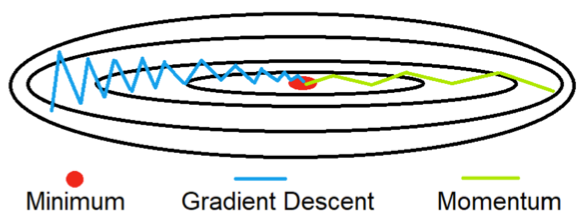



#### 4. **Improves Training Stability**
Standard GD is sensitive to the learning rate $\eta$. A large learning rate causes instability; a small one slows convergence.<br> Momentum smooths updates, reducing instability even if $\eta$ is slightly larger.<br>
Because momentum combines gradients from multiple previous steps, the updates are less sensitive to noisy gradients in any single step.

#### 5. **Balances Speed and Precision**

- Momentum achieves a balance between:
  - **Speed**: Accumulating gradients accelerates movement in consistent directions.
  - **Precision**: Damping oscillations ensures smoother updates.

#### 6. **Works Well with Neural Networks**
- Neural networks have complex, non-convex loss surfaces with:
  - Plateaus,
  - Saddle points,
  - Local minima.
- How Momentum Helps:
  - Escapes saddle points,
  - Moves faster through plateaus,
  - Reduces oscillations in sharp valleys.


### **Problems with Momentum Gradient Descent** ❌

#### 1. **Overshooting in Regions of Low Gradient**
If the momentum builds up too much, it can cause the parameter updates to "overshoot" the minimum, especially in regions where the gradient is small.

Think of a ball rolling down a hill with momentum. If it rolls too fast, it may overshoot the bottom of the valley and climb the opposite slope.

#### 2. **Hyperparameter Sensitivity**

- The performance of momentum heavily depends on the choice of:
  - Momentum coefficient $\beta$ (e.g., 0.9),
  - Learning rate $\eta$.

Poorly chosen values can cause instability (if $\beta$ is too large) or make momentum ineffective (if $\beta$ is too small).<br>
Momentum requires manual tuning of the learning rate $\eta$ and Momentum coefficient $\beta$.

#### 3. **Directional Bias**
If the optimization landscape changes significantly, momentum may "persist" in the old direction before adjusting to the new gradients.
This causes inefficiency, as the updates take time to "catch up" to the correct direction.

Think like a car overshooting a turn due to its speed.


#### 4. **Slow Convergence at Saddle Points**
In high-dimensional optimization (e.g., neural networks), saddle points are more common than local minima. Momentum can struggle to push the parameters out of these regions efficiently.<br>
Momentum does not inherently help escape saddle points because it relies on gradient accumulation. If gradients remain small, the updates also become small.

#### 5. **Non-Adaptive Updates**
Momentum applies the same learning rate and momentum coefficient to all parameters, regardless of their individual gradients.

In neural networks, different parameters might require different learning rates (e.g., deeper layers). For example, weights in deeper layers of a neural network may require smaller updates compared to shallower layers.



In [26]:
import numpy as np

def gradient(theta):
    return 2 * theta  # Gradient of the loss function J(theta) = theta^2

def loss_function(theta):
    return theta ** 2
    
def nesterov_momentum(theta_init, learning_rate, beta, num_steps):
    theta = theta_init
    v = 0  # Initialize velocity (momentum buffer)
    history = []

    for step in range(num_steps):
        # Compute the lookahead position
        lookahead_theta = theta - beta * v
        
        # Compute the gradient at the lookahead position
        grad = gradient(lookahead_theta)
        
        # Update the velocity using the gradient at the lookahead position
        v = beta * v + learning_rate * grad
        
        # Update the parameter
        theta -= v

        # Calculate and print the loss
        loss = loss_function(theta)
        history.append(theta)
        print(f"Step {step+1}: Parameter = {theta:.4f}, Loss = {loss:.4f}")

        # Early stopping condition
        if loss < 1e-2:
            break

    return None

In [36]:
#| code-fold: false
theta_initial = 100
learning_rate = 0.1
beta_1 = 0 # making GD like Batch GD
steps = 100

# Run the Momentum Gradient Descent
nesterov_momentum(theta_initial, learning_rate, beta_1, steps)

Step 1: Parameter = 80.0000, Loss = 6400.0000
Step 2: Parameter = 64.0000, Loss = 4096.0000
Step 3: Parameter = 51.2000, Loss = 2621.4400
Step 4: Parameter = 40.9600, Loss = 1677.7216
Step 5: Parameter = 32.7680, Loss = 1073.7418
Step 6: Parameter = 26.2144, Loss = 687.1948
Step 7: Parameter = 20.9715, Loss = 439.8047
Step 8: Parameter = 16.7772, Loss = 281.4750
Step 9: Parameter = 13.4218, Loss = 180.1440
Step 10: Parameter = 10.7374, Loss = 115.2922
Step 11: Parameter = 8.5899, Loss = 73.7870
Step 12: Parameter = 6.8719, Loss = 47.2237
Step 13: Parameter = 5.4976, Loss = 30.2231
Step 14: Parameter = 4.3980, Loss = 19.3428
Step 15: Parameter = 3.5184, Loss = 12.3794
Step 16: Parameter = 2.8147, Loss = 7.9228
Step 17: Parameter = 2.2518, Loss = 5.0706
Step 18: Parameter = 1.8014, Loss = 3.2452
Step 19: Parameter = 1.4412, Loss = 2.0769
Step 20: Parameter = 1.1529, Loss = 1.3292
Step 21: Parameter = 0.9223, Loss = 0.8507
Step 22: Parameter = 0.7379, Loss = 0.5445
Step 23: Parameter = 0.